C'est ton second checkpoint.
Les 3 exercices principaux sont indépendants. Tu peux donc les effectuer dans l'ordre que tu préfères. Ils se basent tous sur le même dataset.

Essaye de finir ce checkpoint en 4h. Si tu n'as pas tout fini, ce n'est pas grave. Tu pourras le reprendre plus tard, tu indiqueras simplement en commentaire ce que tu as fait a posteriori.
Nous t'avons indiqué des durées estimatives. Evidemment chacun a ses forces et ses faiblesses, avance donc à ton rythme. **Cependant, si tu vois que tu dépasses une durée, ne reste pas bloqué, passe à l'exercice suivant.** Tu pourras revenir à la fin sur ce que tu n'as pas fini.

Il y a deux questions bonus à la fin. Ce sont des exercices pour aller plus loin. Ils sont assez stimulants pour de l'analyse.

----------------
**ENGLISH DISCLAIMER**

This is your second checkpoint.
The 3 main exercises are independent. You can do them in the order you prefer. They are all based on the same dataset.

Try to finish this checkpoint in 4 hours. If you don't finish everything, it's not a big deal. You can do it again later, just comment on what you did afterwards.
We have given you estimated times. Obviously everyone has their own strengths and weaknesses, so go at your own pace. **However, if you see that you're going over a time limit, don't get stuck, just move on to the next exercise** You can come back to what you didn't finish at the end.

There are two bonus questions at the end. These are exercises to go further. They are quite challenging for analysis.

# Checkpoint 2
Please execute the code below

In [45]:
# If running on Google Colab, please uncomment this before running

#! pip install plotly --upgrade

In [46]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score, r2_score, confusion_matrix, classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler

url = "https://raw.githubusercontent.com/murpi/wilddata/master/quests/spotify.zip"
df_music = pd.read_csv(url)
df_music

,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
0,Movie,Henri Salvador,C'est beau de faire un Show,0BRjO6ga9RKCKjfDqeFgWV,0,0.61100,0.389,99373,0.910,0.000000,C#,0.3460,-1.828,Major,0.0525,166.969,4/4,0.814
1,Movie,Martin & les fées,Perdu d'avance (par Gad Elmaleh),0BjC1NfoEOOusryehmNudP,1,0.24600,0.590,137373,0.737,0.000000,F#,0.1510,-5.559,Minor,0.0868,174.003,4/4,0.816
2,Movie,Joseph Williams,Don't Let Me Be Lonely Tonight,0CoSDzoNIKCRs124s9uTVy,3,0.95200,0.663,170267,0.131,0.000000,C,0.1030,-13.879,Minor,0.0362,99.488,5/4,0.368
3,Movie,Henri Salvador,Dis-moi Monsieur Gordon Cooper,0Gc6TVm52BwZD07Ki6tIvf,0,0.70300,0.240,152427,0.326,0.000000,C#,0.0985,-12.178,Major,0.0395,171.758,4/4,0.227
4,Movie,Fabien Nataf,Ouverture,0IuslXpMROHdEPvSl1fTQK,4,0.95000,0.331,82625,0.225,0.123000,F,0.2020,-21.150,Major,0.0456,140.576,4/4,0.390
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
232720,Soul,Slave,Son Of Slide,2XGLdVl7lGeq8ksM6Al7jT,39,0.00384,0.687,326240,0.714,0.544000,D,0.0845,-10.626,Major,0.0316,115.542,4/4,0.962
232721,Soul,Jr Thomas & The Volcanos,Burning Fire,1qWZdkBl4UVPj9lK6HuuFM,38,0.03290,0.785,282447,0.683,0.000880,E,0.2370,-6.944,Minor,0.0337,113.830,4/4,0.969
232722,Soul,Muddy Waters,(I'm Your) Hoochie Coochie Man,2ziWXUmQLrXTiYjCg2fZ2t,47,0.90100,0.517,166960,0.419,0.000000,D,0.0945,-8.282,Major,0.1480,84.135,4/4,0.813
232723,Soul,R.LUM.R,With My Words,6EFsue2YbIG4Qkq8Zr9Rir,44,0.26200,0.745,222442,0.704,0.000000,A,0.3330,-7.137,Major,0.1460,100.031,4/4,0.489


# Data exploration (approximately 1h30)

## Introduction
Display the first rows of the dataset.

In [47]:
# Your code here : 

df_music.head()

,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
0,Movie,Henri Salvador,C'est beau de faire un Show,0BRjO6ga9RKCKjfDqeFgWV,0,0.611,0.389,99373,0.910,0.000,C#,0.3460,-1.828,Major,0.0525,166.969,4/4,0.814
1,Movie,Martin & les fées,Perdu d'avance (par Gad Elmaleh),0BjC1NfoEOOusryehmNudP,1,0.246,0.590,137373,0.737,0.000,F#,0.1510,-5.559,Minor,0.0868,174.003,4/4,0.816
2,Movie,Joseph Williams,Don't Let Me Be Lonely Tonight,0CoSDzoNIKCRs124s9uTVy,3,0.952,0.663,170267,0.131,0.000,C,0.1030,-13.879,Minor,0.0362,99.488,5/4,0.368
3,Movie,Henri Salvador,Dis-moi Monsieur Gordon Cooper,0Gc6TVm52BwZD07Ki6tIvf,0,0.703,0.240,152427,0.326,0.000,C#,0.0985,-12.178,Major,0.0395,171.758,4/4,0.227
4,Movie,Fabien Nataf,Ouverture,0IuslXpMROHdEPvSl1fTQK,4,0.950,0.331,82625,0.225,0.123,F,0.2020,-21.150,Major,0.0456,140.576,4/4,0.390


Describe the dataset including all types of columns (i.e. numerical and the others) and comment the column popularity.

In [48]:
# Your code here : 

df_music.describe()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
count,232725.000000,232725.000000,232725.000000,2.327250e+05,232725.000000,232725.000000,232725.000000,232725.000000,232725.000000,232725.000000,232725.000000
mean,41.127502,0.368560,0.554364,2.351223e+05,0.570958,0.148301,0.215009,-9.569885,0.120765,117.666585,0.454917
std,18.189948,0.354768,0.185608,1.189359e+05,0.263456,0.302768,0.198273,5.998204,0.185518,30.898907,0.260065
min,0.000000,0.000000,0.056900,1.538700e+04,0.000020,0.000000,0.009670,-52.457000,0.022200,30.379000,0.000000
25%,29.000000,0.037600,0.435000,1.828570e+05,0.385000,0.000000,0.097400,-11.771000,0.036700,92.959000,0.237000
50%,43.000000,0.232000,0.571000,2.204270e+05,0.605000,0.000044,0.128000,-7.762000,0.050100,115.778000,0.444000
75%,55.000000,0.722000,0.692000,2.657680e+05,0.787000,0.035800,0.264000,-5.501000,0.105000,139.054000,0.660000
max,100.000000,0.996000,0.989000,5.552917e+06,0.999000,0.999000,1.000000,3.744000,0.967000,242.903000,1.000000


In [49]:
df_music.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 232725 entries, 0 to 232724
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   genre             232725 non-null  object 
 1   artist_name       232725 non-null  object 
 2   track_name        232725 non-null  object 
 3   track_id          232725 non-null  object 
 4   popularity        232725 non-null  int64  
 5   acousticness      232725 non-null  float64
 6   danceability      232725 non-null  float64
 7   duration_ms       232725 non-null  int64  
 8   energy            232725 non-null  float64
 9   instrumentalness  232725 non-null  float64
 10  key               232725 non-null  object 
 11  liveness          232725 non-null  float64
 12  loudness          232725 non-null  float64
 13  mode              232725 non-null  object 
 14  speechiness       232725 non-null  float64
 15  tempo             232725 non-null  float64
 16  time_signature    23

In [50]:
df_music.popularity.value_counts()

0      6312
50     5415
53     5414
51     5401
52     5342
       ... 
96        8
94        7
99        4
98        3
100       2
Name: popularity, Length: 101, dtype: int64

The dataset includes text data regarding the genre, artist name, track name and track id. It could be worth noting that the track id is not a number, that alphanumeric format allowing far more combinations with the same number of characters. The time signature is also a string, the musical notation using two numbers seperated by a division sign. The key is a string as well, using the english notation (from A to G), and the mode determines whether the key is major or minor.

Numerical columns include indices like acousticness, danceability, energy, instrumentalness, liveness, speechiness, and valence. Duration is expressed in ms, loudness doesn't say which measurement is used, but it is expressed in dB (probable RMS or LUFS). Tempo is the calculated beat per minute.

Finally, popularity is a number between 0 and 100, most probably an indication of the number of times the track has been played during a set period of time.

Please check the presence / absence of missing values in each column and comment your result.

In [51]:
# Your code here : 

df_music.isna().sum()

genre               0
artist_name         0
track_name          0
track_id            0
popularity          0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
speechiness         0
tempo               0
time_signature      0
valence             0
dtype: int64

The .info() already indicated that there are no missing values, but we can verify it with this code, which is easier to read if there are a huge number of rows.

## Some insights about the artists

Give the number of tracks for each artist. The result will be sorted by descending order for a better readability.

*You can use `groupby`, `crosstab` or `pivot_table` to solve these questions.*


In [52]:
# Your code here : 

df_music.pivot_table(index='artist_name', values='track_id', aggfunc='count').sort_values('track_id', ascending=False)

,track_id
artist_name,
Giuseppe Verdi,1394
Giacomo Puccini,1137
Kimbo Children's Music,971
Nobuo Uematsu,825
Richard Wagner,804
...,...
Melanie De Biasio,1
Mel Tillis,1
Mel Levin,1



Give the mean of popularity for each artist. The result will be sorted by descending order for a better readability.
In addition, who are the 3 most popular artists ?

In [53]:
# Your code here : 

df_popularity = df_music.pivot_table(index='artist_name', values='popularity', aggfunc='mean').sort_values('popularity', ascending=False)
df_popularity

,popularity
artist_name,
Pedro Capó,87.0
Mario Bautista,85.0
Mau y Ricky,83.0
Kris Kross Amsterdam,82.0
Ninho,82.0
...,...
Brent Holmes,0.0
The Wayfarers,0.0
Nursery Rhymes Club,0.0


In [54]:
print(f'The 3 most popular artists based on this data are {df_popularity.index[0]}, {df_popularity.index[1]} and {df_popularity.index[2]}.')

The 3 most popular artists based on this data are Pedro Capó, Mario Bautista and Mau y Ricky.


## What about Queen?
Give the track names of Queen.

In [55]:
# Your code here : 

df_queen_tracks = df_music[df_music['artist_name'] == 'Queen'][['artist_name','track_name']]
df_queen_tracks

,artist_name,track_name
152988,Queen,We Are The Champions
153284,Queen,"Get Down, Make Love - Remastered 2011"
153622,Queen,Sheer Heart Attack - Remastered 2011
153734,Queen,Seaside Rendezvous - Remastered 2011
154806,Queen,Sleeping On The Sidewalk - Remastered 2011
...,...,...
225833,Queen,Fat Bottomed Girls
225906,Queen,"All Dead, All Dead - Remastered 2011"
226106,Queen,Somebody To Love
226296,Queen,No-One But You (Only The Good Die Young)


What are the mean popularity of all songs from the Queen band?

What are their 3 most popular songs?

In [56]:
# Your code here : 
df_queen = df_music[df_music['artist_name'] == 'Queen']
print(f"The average popularity of Queen songs is {round(df_queen.popularity.mean(), 2)}.")

The average popularity of Queen songs is 58.79.


In [57]:
df_queen_top = df_queen.sort_values('popularity', ascending=False).head(3)[['artist_name','track_name', 'popularity']]
df_queen_top

,artist_name,track_name,popularity
166058,Queen,Bohemian Rhapsody - Remastered 2011,82
166059,Queen,Don't Stop Me Now - Remastered,81
166069,Queen,Somebody To Love - Remastered 2011,77


In [58]:
print(f"The 3 most popular songs from Queen are {df_queen_top.iloc[0, 1]}, {df_queen_top.iloc[1, 1]} and {df_queen_top.iloc[2, 1]}.")

The 3 most popular songs from Queen are Bohemian Rhapsody - Remastered 2011, Don't Stop Me Now - Remastered and Somebody To Love - Remastered 2011.


In [59]:
print(f"The 3 most popular songs from Queen are {df_queen_top.iloc[0, 1]}, {df_queen_top.iloc[1, 1]} and {df_queen_top.iloc[2, 1]}.")

The 3 most popular songs from Queen are Bohemian Rhapsody - Remastered 2011, Don't Stop Me Now - Remastered and Somebody To Love - Remastered 2011.


## Transform (apply ?)
Create a new column `nb_words`, with the number of words in each title (track names). It's up to you to choose if punctuation is a word or not.

In [60]:
# Your code here : 
df_music['nb_words'] = df_music['track_name'].apply(lambda x: len(x.split(' ')))
df_music.head(10)

,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,nb_words
0,Movie,Henri Salvador,C'est beau de faire un Show,0BRjO6ga9RKCKjfDqeFgWV,0,0.61100,0.389,99373,0.9100,0.00000,C#,0.3460,-1.828,Major,0.0525,166.969,4/4,0.814,6
1,Movie,Martin & les fées,Perdu d'avance (par Gad Elmaleh),0BjC1NfoEOOusryehmNudP,1,0.24600,0.590,137373,0.7370,0.00000,F#,0.1510,-5.559,Minor,0.0868,174.003,4/4,0.816,5
2,Movie,Joseph Williams,Don't Let Me Be Lonely Tonight,0CoSDzoNIKCRs124s9uTVy,3,0.95200,0.663,170267,0.1310,0.00000,C,0.1030,-13.879,Minor,0.0362,99.488,5/4,0.368,6
3,Movie,Henri Salvador,Dis-moi Monsieur Gordon Cooper,0Gc6TVm52BwZD07Ki6tIvf,0,0.70300,0.240,152427,0.3260,0.00000,C#,0.0985,-12.178,Major,0.0395,171.758,4/4,0.227,4
4,Movie,Fabien Nataf,Ouverture,0IuslXpMROHdEPvSl1fTQK,4,0.95000,0.331,82625,0.2250,0.12300,F,0.2020,-21.150,Major,0.0456,140.576,4/4,0.390,1
5,Movie,Henri Salvador,Le petit souper aux chandelles,0Mf1jKa8eNAf1a4PwTbizj,0,0.74900,0.578,160627,0.0948,0.00000,C#,0.1070,-14.970,Major,0.1430,87.479,4/4,0.358,5
6,Movie,Martin & les fées,"Premières recherches (par Paul Ventimila, Lori...",0NUiKYRd6jt1LKMYGkUdnZ,2,0.34400,0.703,212293,0.2700,0.00000,C#,0.1050,-12.675,Major,0.9530,82.873,4/4,0.533,14
7,Movie,Laura Mayne,Let Me Let Go,0PbIF9YVD505GutwotpB5C,15,0.93900,0.416,240067,0.2690,0.00000,F#,0.1130,-8.949,Major,0.0286,96.827,4/4,0.274,4
8,Movie,Chorus,Helka,0ST6uPfvaPpJLtQwhE6KfC,0,0.00104,0.734,226200,0.4810,0.00086,C,0.0765,-7.725,Major,0.0460,125.080,4/4,0.765,1
9,Movie,Le Club des Juniors,Les bisous des bisounours,0VSqZ3KStsjcfERGdcWpFO,10,0.31900,0.598,152694,0.7050,0.00125,G,0.3490,-7.790,Major,0.0281,137.496,4/4,0.718,4


## Pivot table
Let's do a pivot table with `genre` in rows, `mode` in columns and number of songs in values. 

Which genre-mode duo contains the most songs?

In [61]:
# Your code here : 

df_pivot_mode = df_music.pivot_table(index='genre', columns='mode', values='track_id', aggfunc='count')
df_pivot_mode_top = df_pivot_mode.sort_values(['Major', 'Minor'], ascending=(False, False))
df_pivot_mode_top.head(3)

mode,Major,Minor
genre,,
Country,7583,1081
Folk,7279,2020
Rock,6878,2394


The 3 genres-mode duo with the most songs are Country, Folk and Rock, all in Major mode.

# Dataviz (approximately 1h30)

## Remember, each chart must have :
- beautiful colors
- title
- readable axis ticks
- legend

## Display a correlation heatmap
Color scale has to be **centered on 0-value**, in order to distinguish negative and positive values. Please choose a beautiful **diverging palette**, and remember to **display a title**.


In [62]:
corr = df_music.corr()

fig = go.Figure()

fig.add_trace(go.Heatmap(
    z = corr,
    x = corr.columns.values,
    y = corr.columns.values,
    colorscale=px.colors.diverging.RdBu,
    zmid=0
))

fig.update_layout(width=1200, height=900, title='Correlation Heatmap')
fig.show()

Some columns seem to have strong (negative) correlations between them. 
- Which ones? 
- What does it mean?

In [63]:
# Your answers here :

There are 3 strong negative correlations here. First one is between `energy` and `acousticness`, second one is between `loudness` and `acousticness`, and the last one is between `loudness` and `instrumentalness`.

It makes sense that the more acousticness there is in a track (meaning less amplified sounds), the quieter it is. It also appears that vocal parts are louder than instrumental ones, which means that the more instrumental a track is, the quieter it is as well. Finally, the energy indicator is calculated by an algorithm based on multiple factors, and it appears that based on this negative correlations, instrumentalness and acousticness are a heavy part of its calculation. To confirm this, we can verify that `energy` and `loudness` have a strong positive correlation.

## Find the correlation coefficient between Energy and Acousticness

In [64]:
# Your code here :

# The correlation coefficient can be read using the mouseover on the heatmap, but we can print the coefficient directly as well.

corr.loc['energy']['acousticness']

-0.7255763647090392

## Pairplot
Only for genres Opera and Reggaeton, display a pairplot with different colors for genres (so you'll have 2 colors).

*If the dataset is too big, you can use sampling methods.*

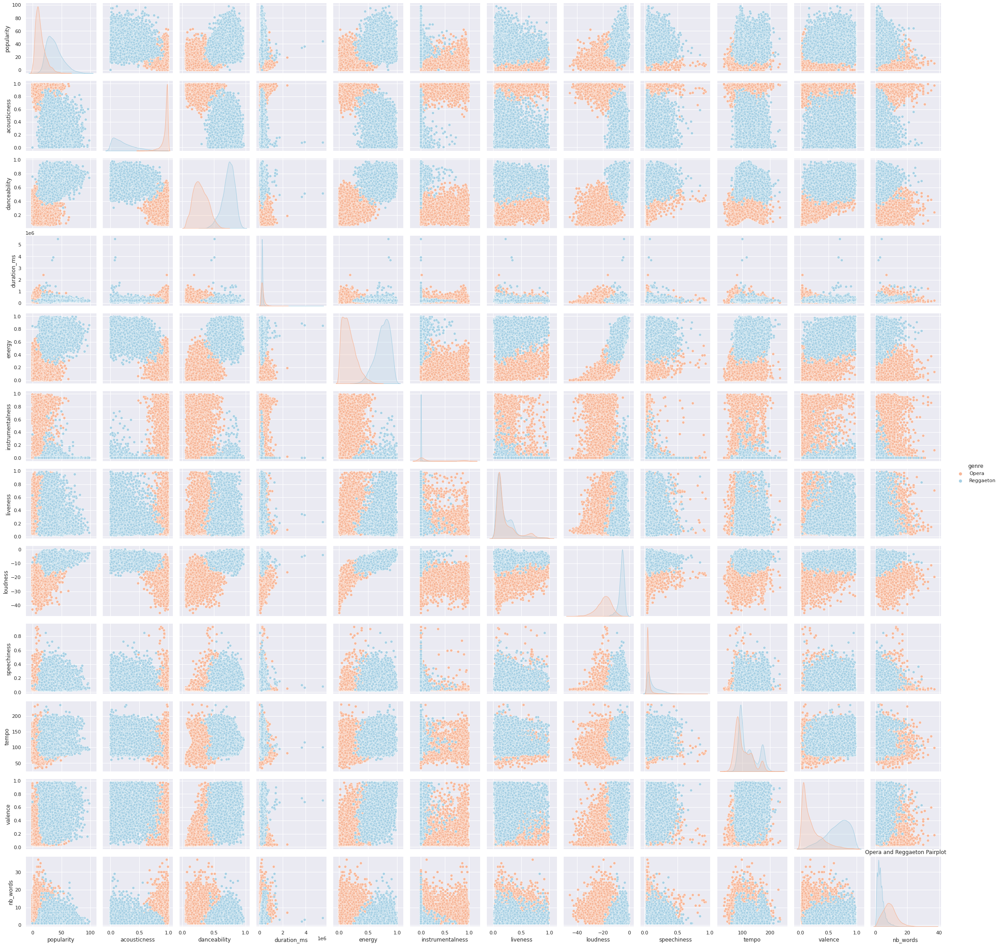

In [65]:
# Your code here :

df_music_matrix = df_music[(df_music['genre'] == 'Opera') | (df_music['genre'] == 'Reggaeton')]
sns.set_theme()

sns.pairplot(df_music_matrix, hue='genre', palette='RdBu')
plt.title('Opera and Reggaeton Pairplot')

plt.show()


## Scatterplot
Draw a scatterplot on the columns of your choice:
- Include only genres Opera and Reggaeton
- Each genre has its own color
- Please choose beautiful colors, and remember to display a title.

In [66]:
# Your code here :

fig = px.scatter(
    data_frame=df_music_matrix,
    x='loudness',
    y='energy',
    color='genre',
    labels={'loudness': 'Loudness', 'energy': 'Energy'},
    color_discrete_map={'Opera': 'linen', 'Reggaeton': 'lightskyblue'},
    opacity=0.5 
)

fig.update_layout(title='Loudness and Energy per Genre', width=800, height=600, template='plotly_dark')
fig.show()



## Boxplot
Draw on the same figure 2 boxplots : 1 by genre.
- Boxplots have to be in vertical
- Filter only on genres Opera and Reggaeton
- Your boxplots represent danceability

Your chart must be similar to this one (without the red arrow)

![boxplot](https://raw.githubusercontent.com/murpi/wilddata/master/checkpoint2_boxplot.png)

In [67]:
# Your code here :

fig = px.box(
    df_music_matrix,
    x='genre',
    y='danceability',
    color='genre',
    color_discrete_map={'Opera': 'linen', 'Reggaeton': 'lightskyblue'},
    labels={'danceability': 'Danceability', 'genre': 'Genre'}
)

fig.update_layout(title='Danceability per Genre', width=800, height=600, template='plotly_dark')
fig.show()


How do we read it ?
- What does the horizontal line near the red arrow represent? What does it mean?

In [68]:
# Your answer here :

# That horizontal line is the 3rd quartile of this data (danceability for Reggaeton).

# Your code here :
# It means that the values above are higher than 75% of the data, and those below are lower than 75% of the data. We can also show it using pandas:
df_music_matrix[df_music_matrix['genre'] == 'Reggaeton']['danceability'].quantile(0.75)


0.8

## Histogram
Draw a histogram for the distribution of "energy", only for the genre 'Country'

In [69]:
# Your code here :

fig = px.histogram(
   df_music[df_music['genre'] == 'Country'],
   x='energy',
   labels={'energy': 'Energy'},
   color_discrete_sequence=['turquoise'],
   nbins=100
)

fig.update_layout(title='Distribution of Energy Index', width=800, height=600, template='plotly_dark')
fig.show()


## Interactive chart
With plotly express, draw an interactive **histogram on energy**. 
- You'll add an animation frame on `genre`.
- Please be sure that the vertical scale is appropriate. Histograms should not "stick out" vertically, regardless of the `genre`.
- Don't forget the title.

In [70]:
# Your code here :

fig = px.histogram(
   df_music,
   x='energy',
   animation_frame='genre',
   labels={'energy': 'Energy'},
   nbins=100,
   color='genre',
   color_discrete_sequence=px.colors.qualitative.Dark24
)

fig.update_yaxes(range=[0, 601])
fig.update_layout(title='Distribution of Energy Index', width=800, height=600, template='plotly_dark')
fig.show()


# Machine Learning : Classification (approximately 1h30)

Train a classification model that predicts the genre between Opera and Reggaeton of a track with wichever columns you want. You can try different algorithms.

Try to get the best accuracy score on your test set!!! (without overfitting)

Please display a confusion matrix as well.

In [71]:
# Your code here:
df_opera_reggaeton = df_music.loc[df_music["genre"].isin(["Opera", "Reggaeton"])]
df_opera_reggaeton


,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,nb_words
57582,Opera,Charles Gounod,Ave Maria,2kyEgPaAW8wdpvevPnkf0Z,62,0.9930,0.1320,163267,0.0195,0.888000,C,0.0569,-29.760,Major,0.0445,81.616,3/4,0.1400,2
57583,Opera,Richard Wagner,Tannhäuser: Overture,1U1i1HBJ5H8DY5J4fO8ySg,58,0.8310,0.0843,853827,0.1820,0.926000,E,0.1970,-15.880,Major,0.0356,73.750,4/4,0.0604,2
57584,Opera,Giacomo Puccini,"""Nessun dorma!""",74WjYdm3Lvbwnds4thYPUU,63,0.9610,0.1710,180933,0.3080,0.005460,D,0.3190,-12.383,Major,0.0456,171.798,5/4,0.0889,2
57585,Opera,Gioachino Rossini,Semiramide: Overture (Live),2wG5UNal67Vkyjsdm3Ahat,2,0.8960,0.2590,746600,0.1980,0.679000,A,0.6890,-19.621,Major,0.0658,158.284,4/4,0.1590,3
57586,Opera,Gioachino Rossini,Overture (Sinfonia),1chTrqszWQEOP4RsNuOZf7,52,0.9110,0.3390,425000,0.1400,0.678000,E,0.1570,-20.598,Major,0.0470,95.975,4/4,0.2960,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
166052,Reggaeton,Juhn,Burberry,6X7OHq7Fjdkl8jgJ7s2SsE,21,0.0200,0.7880,220961,0.8430,0.000000,G,0.1130,-5.417,Major,0.2410,135.874,4/4,0.4000,1
166053,Reggaeton,Musicologo Y Menes,Adicta (feat. Nicky Jam),2SNvQUgGOz7TtvTGbWUd1Z,24,0.0200,0.7730,181985,0.9200,0.000000,F#,0.1190,-4.117,Minor,0.0345,102.006,4/4,0.7590,4
166054,Reggaeton,Alex Kyza,Quien Te Dijo (REMIX) (feat. De La Ghetto),2SybcKL6xs1KizvciGmlwG,17,0.0158,0.8310,295187,0.7260,0.000011,C#,0.0823,-5.327,Minor,0.0380,96.998,4/4,0.4000,8
166055,Reggaeton,N'Klabe,Bailala Como Quieras,5morCKZwjNzpByAkdHyBQB,21,0.4450,0.7990,228573,0.8560,0.000007,A#,0.1690,-3.715,Major,0.1460,99.090,4/4,0.9430,3


In [72]:
# Select the variables, split, and fit the Standard Scaler, then transform the data.

cols = ['acousticness', 'danceability', 'duration_ms', 'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness', 'valence', 'tempo']

X = df_opera_reggaeton[cols]
y = df_opera_reggaeton['genre']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, train_size = 0.75)

scaler = StandardScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [73]:
# KNN

modelKNN = KNeighborsClassifier()
modelKNN.fit(X_train_scaled, y_train)

print(f"Accuracy score on the train dataset: {modelKNN.score(X_train_scaled, y_train)}")
print(f"Accuracy score on the test dataset: {modelKNN.score(X_test_scaled, y_test)}")


Accuracy score on the train dataset: 0.9996900426191399
Accuracy score on the test dataset: 0.99953509995351


Result looks excellent, let's try other algorithms.

In [74]:
# Logistic Regression

modelLR = LogisticRegression()
modelLR.fit(X_train_scaled, y_train)

print(f"Accuracy score on the train dataset: {modelLR.score(X_train_scaled, y_train)}")
print(f"Accuracy score on the test dataset: {modelLR.score(X_test_scaled, y_test)}")

Accuracy score on the train dataset: 0.9996125532739248
Accuracy score on the test dataset: 0.999767549976755


In [75]:
# Decision Tree

modelDTC = DecisionTreeClassifier()
modelDTC.fit(X_train_scaled, y_train)

print(f"Accuracy score on the train dataset: {modelDTC.score(X_train_scaled, y_train)}")
print(f"Accuracy score on the test dataset: {modelDTC.score(X_test_scaled, y_test)}")

Accuracy score on the train dataset: 1.0
Accuracy score on the test dataset: 0.99907019990702


All the models look excellent with the variables chosen, so let's stick to KNN with the default parameters.

In [76]:
pd.DataFrame(data = confusion_matrix(y_true = y_test, y_pred = modelKNN.predict(X_test_scaled)),
             index = modelKNN.classes_ + " ACTUAL",
             columns = modelKNN.classes_ + " PREDICTED")

,Opera PREDICTED,Reggaeton PREDICTED
Opera ACTUAL,2080,0
Reggaeton ACTUAL,2,2220


In [77]:
print(classification_report(y_test, modelKNN.predict(X_test_scaled)))

              precision    recall  f1-score   support

       Opera       1.00      1.00      1.00      2080
   Reggaeton       1.00      1.00      1.00      2222

    accuracy                           1.00      4302
   macro avg       1.00      1.00      1.00      4302
weighted avg       1.00      1.00      1.00      4302



Only one False Negative, this is impressive and almost perfect.

Now train with the same parameters on these 2 genres: Rap and Hip-Hop.
You should have lower score than previously, why?

In [78]:
# Your code here

df_rap_hiphop = df_music.loc[df_music["genre"].isin(["Rap", "Hip-Hop"])]
df_rap_hiphop

,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,nb_words
66607,Hip-Hop,J. Cole,MIDDLE CHILD,2JvzF1RMd7lE3KmFlsyZD8,96,0.14900,0.837,213594,0.364,0.000000,G#,0.2710,-11.713,Major,0.2760,123.984,4/4,0.463,2
66608,Hip-Hop,Meek Mill,Going Bad (feat. Drake),2IRZnDFmlqMuOrYOLnZZyc,95,0.25900,0.889,180522,0.496,0.000000,E,0.2520,-6.365,Minor,0.0905,86.003,4/4,0.544,4
66609,Hip-Hop,21 Savage,a lot,2t8yVaLvJ0RenpXUIAC52d,93,0.03950,0.837,288624,0.636,0.001250,C#,0.3420,-7.643,Major,0.0860,145.972,4/4,0.274,2
66610,Hip-Hop,Rich The Kid,Splashin,79OEIr4J4FHV0O3KrhaXRb,88,0.00195,0.942,177806,0.383,0.000000,A#,0.0922,-8.099,Major,0.5650,100.021,4/4,0.380,1
66611,Hip-Hop,Sheck Wes,Mo Bamba,1xzBco0xcoJEDXktl7Jxrr,92,0.19400,0.729,183907,0.625,0.009860,E,0.2480,-5.266,Major,0.0315,146.034,4/4,0.261,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122392,Rap,Juicy J,On & On (feat. Tory Lanez & Belly),7DWIbNQklCxk329kZpW6so,51,0.04790,0.736,225613,0.581,0.000000,A,0.1670,-7.700,Minor,0.0697,126.006,4/4,0.480,8
122393,Rap,Eminem,Untouchable,6IvespQWGW4USXwexlVKDm,58,0.08030,0.554,370133,0.887,0.000000,G,0.1500,-3.367,Major,0.5030,172.233,4/4,0.648,1
122394,Rap,Lil Baby,Eat Or Starve,5v0XqJN4DE6kVDPfsetdKR,49,0.10700,0.738,180293,0.515,0.000000,C,0.0889,-10.120,Major,0.0984,75.040,4/4,0.647,3
122395,Rap,Future,Outta Time,0AkKwgg6rD4p7EpDlNpSz2,51,0.00597,0.750,168607,0.546,0.000032,F#,0.3770,-6.951,Minor,0.3840,75.443,4/4,0.438,2


In [79]:
X = df_rap_hiphop[cols]
y = df_rap_hiphop['genre']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, train_size = 0.75)

scaler = StandardScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [80]:
modelKNN = KNeighborsClassifier()
modelKNN.fit(X_train_scaled, y_train)

print(f"Accuracy score on the train dataset: {modelKNN.score(X_train_scaled, y_train)}")
print(f"Accuracy score on the test dataset: {modelKNN.score(X_test_scaled, y_test)}")

Accuracy score on the train dataset: 0.6439006836991724
Accuracy score on the test dataset: 0.40824697754749567


In [81]:
pd.DataFrame(data = confusion_matrix(y_true = y_test, y_pred = modelKNN.predict(X_test_scaled)),
             index = modelKNN.classes_ + " ACTUAL",
             columns = modelKNN.classes_ + " PREDICTED")

,Hip-Hop PREDICTED,Rap PREDICTED
Hip-Hop ACTUAL,965,1394
Rap ACTUAL,1347,926


Score is much lower with the same model and same parameters, with also some overfitting. This can be explained by the fact that Rap and Hip-Hop are very similar genres, and the model is not able to distinguish correctly between them.

# Machine Learning : Regression (bonus question)
In this part we will try to predict the **"loudness"** of a track. 

## Univariate regression
First we will train an **univariate linear regression** model.

Find the most correlated column with **loudness**.

In [82]:
# Your code here :

# We can get that value from the heatmap earlier, but let's print it to make sure, and read the second line to get the best correlation.

corr['loudness'].sort_values(ascending=False)


loudness            1.000000
energy              0.816088
danceability        0.438668
valence             0.399901
popularity          0.363011
tempo               0.228364
liveness            0.045686
speechiness        -0.002273
duration_ms        -0.047618
nb_words           -0.338822
instrumentalness   -0.506320
acousticness       -0.690202
Name: loudness, dtype: float64

Best correlation is between `energy` and `loudness`.

Split your dataset into a train and test set (using 80% as train and 20% as test). 

Use a `random_state` of **1** (for reproductivity sake).

In [83]:
# Your code here :

X = df_music[['energy']]
y = df_music['loudness']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1, train_size = 0.8)

Now train your model on the train set.

In [84]:
# Your code here :
modelLinReg = LinearRegression().fit(X_train, y_train)


And evaluate it on the test set. If you did everything right your score should be `0.6689508695872618`.

In [85]:
# Your code here :

print(f"Accuracy score on the train dataset: {modelLinReg.score(X_train, y_train)}")
print(f"Accuracy score on the test dataset: {modelLinReg.score(X_test, y_test)}")


Accuracy score on the train dataset: 0.6652567706815302
Accuracy score on the test dataset: 0.6689508695872618


Visualize your data with a scatter plot (different colors for the train and the test set).

Add a lineplot of the regression.

You should get something like this. But of course, your graphic will have nicer colors, and a title!

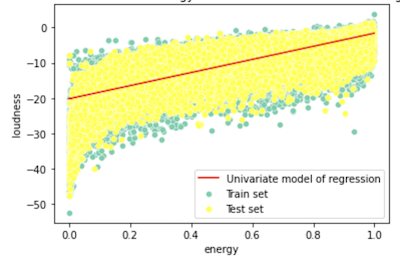

In [98]:
fig = px.scatter(
    df_music,
    x='energy',
    y='loudness',
    opacity=0.65, 
    trendline='ols',     
    trendline_color_override='white',
    color_discrete_sequence=['lightskyblue'],
    labels={'energy': 'Energy', 'loudness': 'Loudness'}
)

fig.update_layout(
    title='Linear Regression Line Between Energy and Loudness',
    width=1000,
    height=600,
    template='plotly_dark'
    )
fig.show()

In [99]:
# Didn't have the time to show train and test data separetely :(

Print the equation of the regression.

In [88]:
# Replace a and b by the coefficients

print(f"{modelLinReg.coef_} * x + {modelLinReg.intercept_}")

[18.56775242] * x + -20.171580657530956


Please predict the "**loudness**" for a an energy of 0.62

In [89]:
# Your code here :

# Hand calculation :
print("By hand :", modelLinReg.coef_ * 0.62 + modelLinReg.intercept_ )

# With a Scikit-Learn function :
print("Scikit-Learn :  ", modelLinReg.predict([[0.62]]))

By hand : [-8.65957415]
Scikit-Learn :   [-8.65957415]


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:446: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



## Multivariate regression

Now you will predict the **loudness** of a track with all the others numericals columns. 

You will do all the needed steps and keep a `random_state` of 1.

Your test score should be : `0.7650705916016727`. Is there overfitting?

In [90]:
columns =["acousticness", "danceability", "duration_ms", "energy",
          "instrumentalness", "liveness", "popularity", "speechiness", "tempo", "valence"]

X = df_music[columns]
y = df_music['loudness']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1, train_size = 0.8)

modelLinReg = LinearRegression().fit(X_train, y_train)

print(f"Accuracy score on the train dataset: {modelLinReg.score(X_train, y_train)}")
print(f"Accuracy score on the test dataset: {modelLinReg.score(X_test, y_test)}")

Accuracy score on the train dataset: 0.7654273687641636
Accuracy score on the test dataset: 0.7650705916016727


Accuracy is as expected, and there is no overfitting at all.

# Comparison between the top 1% popularity and the total dataset (bonus question)
Find a way to compare songs with highest popularity and the others. Something like this example, but you could be creative.

Here we've compared the frequencies by genre (35% of top-songs are "pop", versus 4% of pop songs in the total dataset)




![comparison](https://raw.githubusercontent.com/murpi/wilddata/master/checkpoint2_comparison.png)

In [91]:
# Your code here :
df_music_genre_frequency = pd.DataFrame(df_music['genre'].value_counts(normalize=True))
df_music_genre_frequency.reset_index(inplace=True)
df_music_genre_frequency.rename(columns={'index': 'genre', 'genre': 'frequency'}, inplace=True)


In [92]:
df_music_top_1 = df_music.sort_values(by=['popularity'], ascending=False).head(int(df_music.shape[0] / 100))

df_music_top_1_genre_frequency = pd.DataFrame(df_music_top_1['genre'].value_counts(normalize=True))
df_music_top_1_genre_frequency.reset_index(inplace=True)
df_music_top_1_genre_frequency.rename(columns={'index': 'genre', 'genre': 'frequency'}, inplace=True)

In [93]:
fig = go.Figure()

fig.add_trace(go.Bar(
    name='Top 1%',
    x=df_music_top_1_genre_frequency.genre,
    y=df_music_top_1_genre_frequency.frequency,
    marker_color='lightskyblue'
))

fig.add_trace(go.Bar(
    name='Total',
    x=df_music_genre_frequency.genre,
    y=df_music_genre_frequency.frequency,
    marker_color='linen'
))

fig.update_layout(barmode='group',
                  title='Frequency per genre, comparing overall data and top 1% in popularity',
                  width=1400,
                  height=800,
                  template='plotly_dark',
                  xaxis_title='Genre',
                  yaxis_title='Frequency')
fig.show()